***All 53550 events***

In [3]:
import numpy as np
import folium
from folium.plugins import FastMarkerCluster
import pandas as pd

# Load the XYZ file grid points
data_xyz = np.loadtxt('../../resources/raw/C_SR_resampled.xyz')
lon_xyz = data_xyz[:, 0]
lat_xyz = data_xyz[:, 1]
z_xyz = data_xyz[:, 2]

# Create a Folium map centered on the data's extent
m = folium.Map(location=[np.mean(lat_xyz), np.mean(lon_xyz)], zoom_start=5)

# Basemaps
folium.TileLayer(tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
        attr = 'Esri',
        name = 'Esri Satellite',
        overlay = False,
        control = True,
        show = True).add_to(m)

folium.raster_layers.TileLayer("OpenStreetMap", show=False).add_to(m)
folium.raster_layers.TileLayer("stamentoner", show=False).add_to(m)
folium.raster_layers.TileLayer("stamenterrain", show=False).add_to(m)


# Create a feature group for the bound of Siracusa grid points
fg_gridbound = folium.FeatureGroup(name='Grid Boundary').add_to(m)
xyzbounds = [[lat_xyz.min(), lon_xyz.min()], [lat_xyz.max(), lon_xyz.max()]]
folium.Rectangle(bounds=xyzbounds, color='#ff7800', fill=True, fill_color='#ffff00', fill_opacity=0.12).add_to(fg_gridbound)

# Create a feature group for the XYZ grid points
fg_xyz = folium.FeatureGroup(name='Grid Points').add_to(m)

# Add a circle marker for each XYZ data point with a tooltip showing its z value
for lat, lon, z in zip(lat_xyz, lon_xyz, z_xyz):
    folium.CircleMarker(location=[lat, lon],
                        radius=0.1,
                        color='red',
                        opacity=0.25,
                        popup=str(z)).add_to(fg_xyz)

# Create a feature group for the offshore points 
fg_pts = folium.FeatureGroup(name='Offshore Points').add_to(m)

# Load the points file
data_pts = np.loadtxt('../../resources/raw/pois_eastern_sicily_2km.txt', dtype=str)
id_pts = data_pts[:, 0]
lon_pts = data_pts[:, 1].astype(float)
lat_pts = data_pts[:, 2].astype(float)
z_pts = data_pts[:, 3].astype(float)

# Add a marker for each point with a tooltip showing its id
for i, (id, lat, lon, z) in enumerate(zip(id_pts, lat_pts, lon_pts, z_pts)):
    info = f"ID:{id}, Depth: {z}, {i}"  # Create tooltip string
    folium.CircleMarker(location=[lat, lon], radius=1,opacity = 1,
                  tooltip=info,
                #   color='blue',
                  permanent=True).add_to(fg_pts)

# Read earthquake events data from txt files
data_BS = pd.read_csv('../../resources/processed/eve_BS.txt',sep='\t')
data_PS = pd.read_csv('../../resources/processed/eve_PS.txt',sep='\t')
data_reg = pd.read_csv('../../resources/processed/source_region.txt',sep='\t')

data_events = data_PS.append(data_BS)
# data_events = data_ngi
# regions = data_events['Source_Region'].unique()
# data_reg = data_reg[data_reg['Region'].isin(regions)]
# some filter on events based on mag
# data_BS = data_BS[data_BS['max_flow_depth']>9]
# data_PS = data_PS[data_PS['max_flow_depth']>9]
# data_reg = data_reg[data_reg['Type'] == 'PS']

condition = [data_reg['Type'] == 'BS',data_reg['Type'] == 'PS',data_reg['Type'] == 'BS/PS']
colors = ['red','blue','green']
data_reg['Col'] = np.select(condition,colors)
region_all = data_reg.copy()
    
#Create a feature group for the earthquake events by type
fg_reg = folium.FeatureGroup(name='Regions').add_to(m)

#Add rectangles for each region
for index,row in data_reg.iterrows():
    info = f"ID:{row['Region']},Type: {row['Type']}"  # Create tooltip string
    UR = row['UL_Lat'],row['LR_Lon']
    LL = row['LR_Lat'],row['UL_Lon']

    folium.Rectangle(bounds=[UR,LL],
                     color=row['Col'],
                     fill=True,
                     fill_color='#ffff00',
                     fill_opacity=0.1,
                     tooltip=info,
                     permanent=True).add_to(fg_reg)
    

#Create a fastclustermarker for the earthquake events by type
callback = ('function (row) {' 
                'var marker = L.marker(new L.LatLng(row[0], row[1]), {color: "red"});'
                'var icon = L.AwesomeMarkers.icon({'
                "icon: 'info-sign',"
                "iconColor: 'white',"
                "markerColor: 'red',"
                "prefix: 'glyphicon',"
                "extraClasses: 'fa-rotate-0'"
                    '});'
                'marker.setIcon(icon);'
                "var popup = L.popup({maxWidth: '300'});"
                "const display_text = {text: row[2]};"
                "var mytext = $(`<div id='mytext' class='display_text' style='width: 100.0%; height: 100.0%;'> ${display_text.text}</div>`)[0];"
                "popup.setContent(mytext);"
                "marker.bindPopup(popup);"
                'return marker};')
                             
FastMarkerCluster(data_events[['Lat', 'Long','ID']].values.tolist(), callback=callback,name='EQ Events').add_to(m)

# Add a layer control to turn on/off the feature groups
folium.LayerControl().add_to(m)

# Save the map as an HTML file or plot here
# m.save('./../resources/gis/html/SRmap_explore.html')
m



/tmp/ipykernel_3968920/545822528.py:67: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_events = data_PS.append(data_BS)


***1080 PS train events***

In [4]:
# Create a Folium map centered on the data's extent
newm = folium.Map(location=[np.mean(lat_xyz), np.mean(lon_xyz)], zoom_start=5)

data_ngi = pd.read_csv('../../resources/processed/EventInfo_NGI.txt',sep='\t')
data_reg = pd.read_csv('../../resources/processed/source_region.txt',sep='\t')


regions = data_ngi['Source_Region'].unique()
data_reg = data_reg[data_reg['Region'].isin(regions)]

condition = [data_reg['Type'] == 'BS',data_reg['Type'] == 'PS',data_reg['Type'] == 'BS/PS']
colors = ['red','blue','green']
data_reg['Col'] = np.select(condition,colors)
    
#Create a feature group for the earthquake events by type
fg_reg_ngi = folium.FeatureGroup(name='Regions').add_to(newm)

#Add rectangles for each region
for index,row in data_reg.iterrows():
    info = f"ID:{row['Region']},Type: {row['Type']}"  # Create tooltip string
    UR = row['UL_Lat'],row['LR_Lon']
    LL = row['LR_Lat'],row['UL_Lon']

    folium.Rectangle(bounds=[UR,LL],
                     color=row['Col'],
                     fill=True,
                     fill_color='#ffff00',
                     fill_opacity=0.1,
                     tooltip=info,
                     permanent=True).add_to(fg_reg_ngi)
    

                            
FastMarkerCluster(data_ngi[['Lat', 'Long','ID']].values.tolist(), callback=callback,name='EQ Events').add_to(newm)

# Add a layer control to turn on/off the feature groups
folium.LayerControl().add_to(newm)

newm

***total 53k vs 1080 selection***

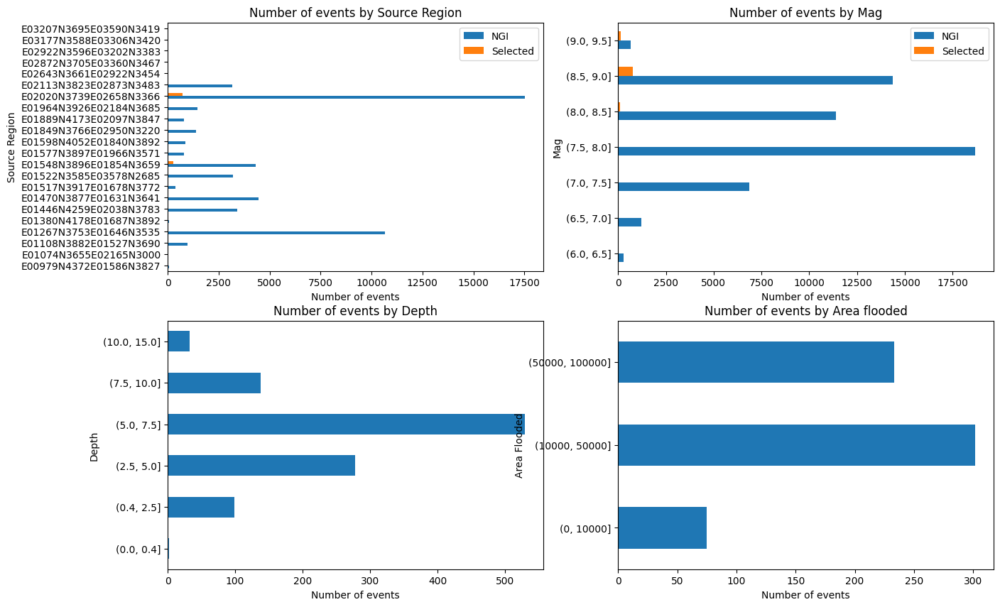

In [47]:
#create plots for summary of events
import matplotlib.pyplot as plt
import seaborn as sns

#create comparison plot between 1080 and total 15k selection
#data_ngi vs data_events 
fig, ax = plt.subplots(2,2,figsize=(15, 10))

#plot the number of events by type - Source Region
count_all = data_events.groupby('Source_Region')['Source_Region'].size().reset_index(name='counts')
count_sel = data_ngi.groupby('Source_Region')['Source_Region'].size().reset_index(name='counts')

#merge the counts from two dataframes and plot
count_all = count_all.merge(count_sel,how='left',on='Source_Region')
count_all.columns = ['Source_Region','NGI','Selected']
count_all.plot(kind='barh',ax=ax[0,0],x='Source_Region',y=['NGI','Selected'])
ax[0,0].set_title('Number of events by Source Region')
ax[0,0].set_xlabel('Number of events')
ax[0,0].set_ylabel('Source Region')

#plot the number of events by type - Mag
count_all = data_events.groupby(pd.cut(data_events['Mag'],[6,6.5,7,7.5,8,8.5,9,9.5]))['Mag'].size().reset_index(name='counts')
count_sel = data_ngi.groupby(pd.cut(data_ngi['Mag'],[6,6.5,7,7.5,8,8.5,9,9.5]))['Mag'].size().reset_index(name='counts')

#merge the counts from two dataframes and plot
count_all = count_all.merge(count_sel,how='left',on='Mag')
count_all.columns = ['Mag','NGI','Selected']
count_all.plot(kind='barh',ax=ax[0,1],x='Mag',y=['NGI','Selected'])
ax[0,1].set_title('Number of events by Mag')
ax[0,1].set_xlabel('Number of events')
ax[0,1].set_ylabel('Mag')

#plot the number of events by type - Depth
data_ngi.groupby(pd.cut(data_ngi['max_flow_depth'],[0,0.4,2.5,5,7.5,10,15] ))['max_flow_depth'].count().plot(kind='barh',ax=ax[1,0])
ax[1,0].set_title('Number of events by Depth')
ax[1,0].set_xlabel('Number of events')
ax[1,0].set_ylabel('Depth')


#plot the number of events by area inundation
data_ngi.groupby(pd.cut(data_ngi['inundated_pixels'],[0,10000,50000,100000] ))['inundated_pixels'].count().plot(kind='barh',ax=ax[1,1])
ax[1,1].set_title('Number of events by Area flooded')
ax[1,1].set_xlabel('Number of events')
ax[1,1].set_ylabel('Area Flooded')
plt.show()

Process the keyword into usable terms

In [48]:
#read 15k PS eve file processed by erlend having inundation stats
DF_PSEvents = pd.read_csv('../resources/processed/df_PS_stats.csv',sep=',')

#Update column name
DF_PSEvents.columns

#First row
DF_PSEvents.iloc[0]

#Split text from scenario id to more info 
#3_PS_2798/1583_E01548N3896E01854N3659-PS-Str_PYes_Var-M861_E01742N3823_S005
DF_PSEvents['folder'] = DF_PSEvents['scenario'].str.split('/',expand=True)[0]

Temp = DF_PSEvents['scenario'].str.split('/',expand=True)[1].str.split('-',expand=True)[0]

DF_PSEvents['pid'] =Temp.str.split('_',expand=True)[0]
DF_PSEvents['region'] =Temp.str.split('_',expand=True)[1]

DF_PSEvents['mag'] = DF_PSEvents['scenario'].str.split('-',expand=True)[3].str.split('_',expand=True)[0].str.replace("M","")
DF_PSEvents['mag'] = DF_PSEvents['mag'].astype(float)/100

DF_PSEvents['lon'] = DF_PSEvents['scenario'].\
    str.split('-',expand=True)[3].\
    str.split('_',expand=True)[1].\
    str.replace("E","").str.split('N',expand=True)[0].astype(float)/100

DF_PSEvents['lat'] = DF_PSEvents['scenario'].\
    str.split('-',expand=True)[3].\
    str.split('_',expand=True)[1].\
    str.replace("E","").str.split('N',expand=True)[1].astype(float)/100


15k PS events vs 1080 selection

15k events vs 1080 events


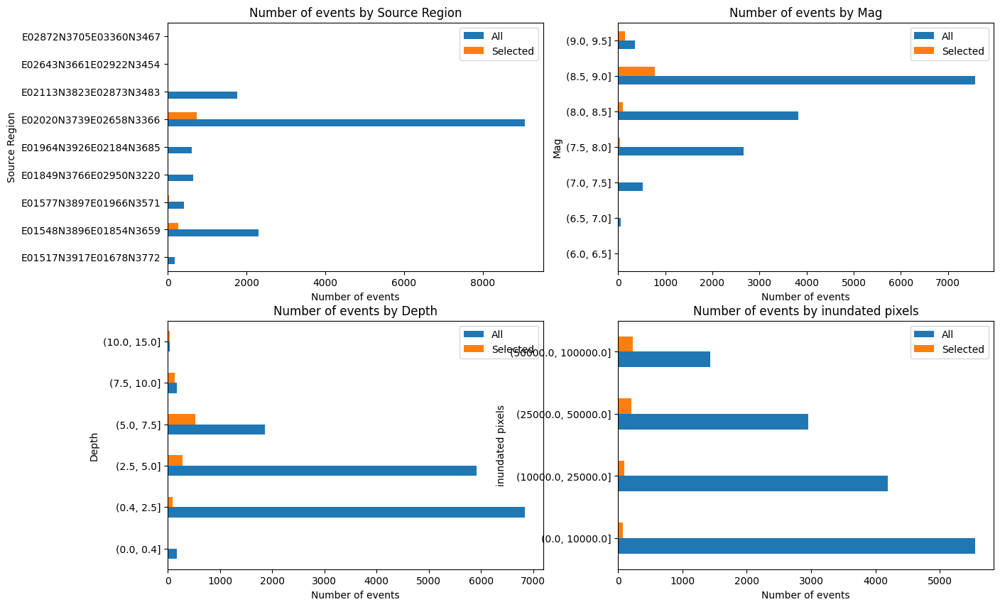

In [49]:
#create comparison plot between 1080 and total 15k selection
#data_PS vs data_ngi 

# print(DF_PSEvents.columns)
# ['scenario', 'max_flow_depth', 'inundated_pixels', 'max_eta', 'is_train',
#        'log_max_eta', 'square_max_eta', 'folder', 'pid', 'region', 'mag',
#        'lon', 'lat']

# print(data_ngi.columns)
# ['Index', 'Folder', 'PID', 'ID', 'Source_Region', 'Type', 'Scaling',
#        'Rupture Model', 'Rigidity', 'Mag', 'Slip Model', 'Lat', 'Long',
#        'max_flow_depth', 'inundated_pixels', 'max_eta', 'is_train',
#        'log_max_eta', 'square_max_eta']

DF_PSEvents.columns = ['ID', 'max_flow_depth', 'inundated_pixels', 'max_eta', 'is_train',
       'log_max_eta', 'square_max_eta', 'folder', 'pid', 'Source_Region', 'Mag',
       'lon', 'lat']


fig, ax = plt.subplots(2,2,figsize=(15, 10))

#plot the number of events by type - Source Region
count_all = DF_PSEvents.groupby('Source_Region')['Source_Region'].size().reset_index(name='counts')
count_sel = data_ngi.groupby('Source_Region')['Source_Region'].size().reset_index(name='counts')

#merge the counts from two dataframes and plot
count_all = count_all.merge(count_sel,how='left',on='Source_Region')
count_all.columns = ['Source_Region','All','Selected']
count_all.plot(kind='barh',ax=ax[0,0],x='Source_Region',y=['All','Selected'])
ax[0,0].set_title('Number of events by Source Region')
ax[0,0].set_xlabel('Number of events')
ax[0,0].set_ylabel('Source Region')

#plot the number of events by type - Mag
count_all = DF_PSEvents.groupby(pd.cut(DF_PSEvents['Mag'],[6,6.5,7,7.5,8,8.5,9,9.5]))['Mag'].size().reset_index(name='counts')
count_sel = data_ngi.groupby(pd.cut(data_ngi['Mag'],[6,6.5,7,7.5,8,8.5,9,9.5]))['Mag'].size().reset_index(name='counts')

#merge the counts from two dataframes and plot
count_all = count_all.merge(count_sel,how='left',on='Mag')
count_all.columns = ['Mag','All','Selected']
count_all.plot(kind='barh',ax=ax[0,1],x='Mag',y=['All','Selected'])
ax[0,1].set_title('Number of events by Mag')
ax[0,1].set_xlabel('Number of events')
ax[0,1].set_ylabel('Mag')

#plot the number of events by type - Depth
count_all = DF_PSEvents.groupby(pd.cut(DF_PSEvents['max_flow_depth'],[0,0.4,2.5,5,7.5,10,15]))['max_flow_depth'].size().reset_index(name='counts')
count_sel = data_ngi.groupby(pd.cut(data_ngi['max_flow_depth'],[0,0.4,2.5,5,7.5,10,15]))['max_flow_depth'].size().reset_index(name='counts')

#merge the counts from two dataframes and plot
count_all = count_all.merge(count_sel,how='left',on='max_flow_depth')
count_all.columns = ['max_flow_depth','All','Selected']
count_all.plot(kind='barh',ax=ax[1,0],x='max_flow_depth',y=['All','Selected'])
ax[1,0].set_title('Number of events by Depth')
ax[1,0].set_xlabel('Number of events')
ax[1,0].set_ylabel('Depth')


#plot the number of events by type - inundated_pixels
count_all = DF_PSEvents.groupby(pd.cut(DF_PSEvents['inundated_pixels'],[0,1e4,2.5e4,5e4,1e5]))['inundated_pixels'].size().reset_index(name='counts')
count_sel = data_ngi.groupby(pd.cut(data_ngi['inundated_pixels'],[0,1e4,2.5e4,5e4,1e5]))['inundated_pixels'].size().reset_index(name='counts')

#merge the counts from two dataframes and plot
count_all = count_all.merge(count_sel,how='left',on='inundated_pixels')
count_all.columns = ['inundated_pixels','All','Selected']
count_all.plot(kind='barh',ax=ax[1,1],x='inundated_pixels',y=['All','Selected'])
ax[1,1].set_title('Number of events by inundated pixels')
ax[1,1].set_xlabel('Number of events')
ax[1,1].set_ylabel('inundated pixels')
print('15k events vs 1080 events')

plt.show()


***All BS and PS EQ Locations***

In [5]:
#Create location keyword
DF_eve = data_events
DF_eve.columns = ['ID', 'Source_Region', 'Type', 'Mag', 'lon', 'lat', 'SlipModel',
'Scaling', 'RuptureModel', 'Rigidity', 'Depth', 'Strike', 'Dip', 'Rake', 'Length', 'Area', 'Slip']


DF_eve['Location'] = ((DF_eve['lat']*100).astype(int).astype(str) + (DF_eve['lon']*100).astype(int).astype(str))
 
#Calculate event counts per unique location
for l in range(len(DF_eve['Location'].unique())):
    DF_eve.loc[DF_eve['Location'] == DF_eve['Location'].unique()[l],'LocationCount'] = \
    len(DF_eve[DF_eve['Location'] == DF_eve['Location'].unique()[l]])

#Unique EQ locations
unique_locations = pd.DataFrame(DF_eve['Location'].unique())
print('uniques EQ locations in 53k dataset:',len(unique_locations))
unique_locations.columns = ['LocationKey']

unique_locations['lat'] = unique_locations['LocationKey'].str.slice(0,4).astype(int)/100
unique_locations['lon'] = unique_locations['LocationKey'].str.slice(4,8).astype(int)/100


#Create a map with the unique locations
eve_map = folium.Map(location=[np.mean(unique_locations['lat']),
                               np.mean(unique_locations['lon'])],
                               zoom_start=7, tiles='Stamen Terrain')

# Basemaps
folium.TileLayer(tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
        attr = 'Esri',
        name = 'Esri Satellite',
        overlay = False,
        control = True,
        show = False).add_to(eve_map)

#add layer for each unique location
fg_Unq_EQ = folium.FeatureGroup(name='Unique EQ Location').add_to(eve_map)
for i in range(len(unique_locations)-1):
    folium.CircleMarker([unique_locations.loc[i+1,'lat'], unique_locations.loc[i+1,'lon']],
                        popup=unique_locations.loc[i+1,'LocationKey'],radius= 1,color = 'orange' ).add_to(fg_Unq_EQ)

# Add a layer control to turn on/off the feature groups
folium.LayerControl().add_to(eve_map)

# Save the map as an HTML file or plot here
# eve_map.save('tsu_PS_eve_map.html')

eve_map


uniques EQ locations in 53k dataset: 1283


***15k PS locations***

In [51]:
#Create location keyword
DF_eve = DF_PSEvents
DF_eve['Location'] = ((DF_eve['lat']*100).astype(int).astype(str) + (DF_eve['lon']*100).astype(int).astype(str))
 
#Calculate event counts per unique location
for l in range(len(DF_eve['Location'].unique())):
    DF_eve.loc[DF_eve['Location'] == DF_eve['Location'].unique()[l],'LocationCount'] = \
    len(DF_eve[DF_eve['Location'] == DF_eve['Location'].unique()[l]])

#Unique EQ locations
unique_locations = pd.DataFrame(DF_eve['Location'].unique())
print('uniques EQ locations in 15k dataset:',len(unique_locations))
unique_locations.columns = ['LocationKey']

unique_locations['lat'] = unique_locations['LocationKey'].str.slice(0,4).astype(int)/100
unique_locations['lon'] = unique_locations['LocationKey'].str.slice(4,8).astype(int)/100


#Create a map with the unique locations
eve_map = folium.Map(location=[np.mean(unique_locations['lat']),
                               np.mean(unique_locations['lon'])],
                               zoom_start=7, tiles='Stamen Terrain')

# Basemaps
folium.TileLayer(tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
        attr = 'Esri',
        name = 'Esri Satellite',
        overlay = False,
        control = True,
        show = False).add_to(eve_map)

#add layer for each unique location
fg_Unq_EQ = folium.FeatureGroup(name='Unique EQ Location').add_to(eve_map)
for i in range(len(unique_locations)-1):
    folium.CircleMarker([unique_locations.loc[i+1,'lat'], unique_locations.loc[i+1,'lon']],
                        popup=unique_locations.loc[i+1,'LocationKey'],radius= 1,color = 'orange').add_to(fg_Unq_EQ)

# Add a layer control to turn on/off the feature groups
folium.LayerControl().add_to(eve_map)

# Save the map as an HTML file or plot here
# eve_map.save('tsu_PS_eve_map.html')

eve_map




uniques EQ locations in 15k dataset: 829


***NGI training set locations - 1080***

In [52]:
#Create location keyword
DF_eve = data_ngi

DF_eve['Location'] = ((DF_eve['Lat']*100).astype(int).astype(str) + (DF_eve['Long']*100).astype(int).astype(str))
 
#Calculate event counts per unique location
for l in range(len(DF_eve['Location'].unique())):
    DF_eve.loc[DF_eve['Location'] == DF_eve['Location'].unique()[l],'LocationCount'] = \
    len(DF_eve[DF_eve['Location'] == DF_eve['Location'].unique()[l]])

#Unique EQ locations
unique_locations = pd.DataFrame(DF_eve['Location'].unique())
print('uniques EQ locations in 1080 events:',len(unique_locations))
unique_locations.columns = ['LocationKey']

unique_locations['lat'] = unique_locations['LocationKey'].str.slice(0,4).astype(int)/100
unique_locations['lon'] = unique_locations['LocationKey'].str.slice(4,8).astype(int)/100

#Create a map with the unique locations
eve_map = folium.Map(location=[np.mean(unique_locations['lat']),
                               np.mean(unique_locations['lon'])],
                               zoom_start=6, tiles='Stamen Terrain')

#add layer for each unique location
fg_Unq_EQ = folium.FeatureGroup(name='Unique EQ Location').add_to(eve_map)
for i in range(len(unique_locations)-1):
    folium.CircleMarker([unique_locations.loc[i+1,'lat'], unique_locations.loc[i+1,'lon']],
                        popup=unique_locations.loc[i+1,'LocationKey'],radius= 1).add_to(fg_Unq_EQ)

# Add a layer control to turn on/off the feature groups
folium.LayerControl().add_to(eve_map)

# # Save the map as an HTML file or plot here
# # eve_map.save('tsu_PS_eve_map.html')

eve_map




uniques EQ locations in 1080 events: 304


***Select events to run my experiments for EGU***

***By inundation properties - area and depth***

Plots from 15k dataset


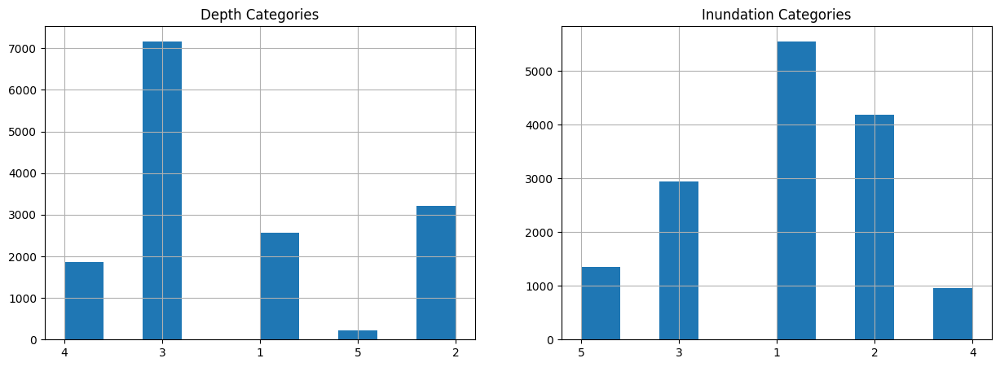

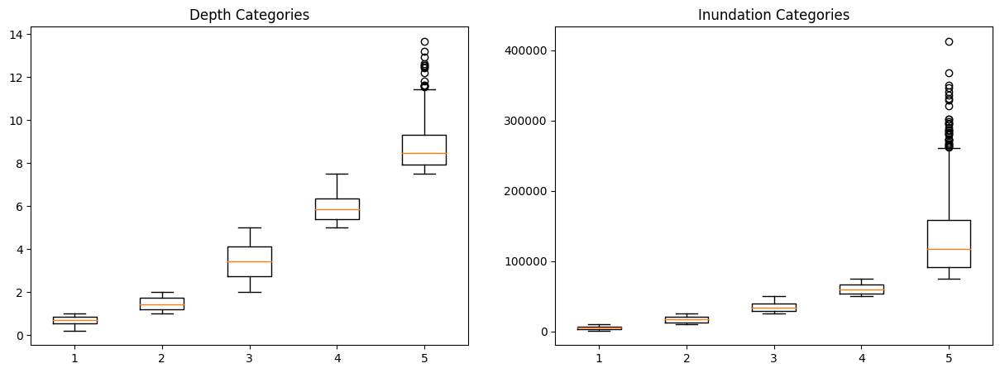

min class: InuCat  has: 955 events
min class: DepCat  has: 152 events
New data size: 760
Plots from undersampled dataset


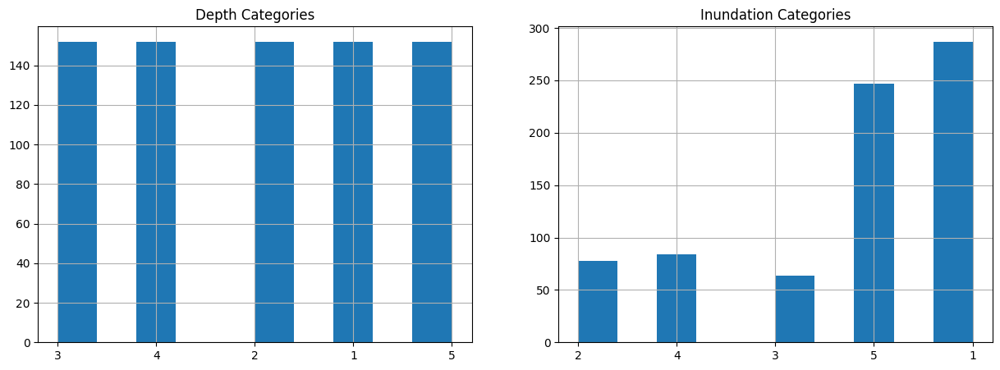

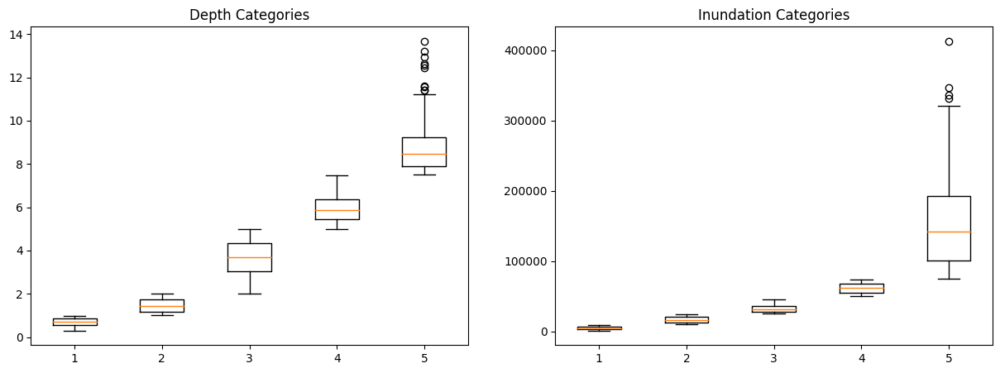

In [53]:
#Sample scenario or events from 15k file to well distribute inundation and max depth parameters
Data2Use = DF_PSEvents

#Sample events
column = 'max_flow_depth'
depth_condition = [(Data2Use[column] <= 1),
                   (Data2Use[column] > 1) & (Data2Use[column] <= 2),
                   (Data2Use[column] > 2) & (Data2Use[column] <= 5),
                   (Data2Use[column] > 5) & (Data2Use[column] <= 7.5),
                   (Data2Use[column] > 7.5)]
column = 'inundated_pixels'
inun_condition = [(Data2Use[column] <=1e4),
                   (Data2Use[column] > 1e4) & (Data2Use[column] <= 2.5e4),
                   (Data2Use[column] > 2.5e4) & (Data2Use[column] <= 5e4),
                   (Data2Use[column] > 5e4) & (Data2Use[column] <= 7.5e4),
                   (Data2Use[column] > 7.5e4)]

cat = ['1','2','3','4','5']
Data2Use['DepCat'] = np.select(depth_condition,cat[:len(depth_condition)],default='0')
Data2Use['InuCat'] = np.select(inun_condition,cat[:len(inun_condition)],default='0')

#plot histogram of depth and inundation categories
print('Plots from 15k dataset')
fig, ax = plt.subplots(1,2,figsize=(15,5))
Data2Use['DepCat'].hist(ax=ax[0])
Data2Use['InuCat'].hist(ax=ax[1])
ax[0].set_title('Depth Categories')
ax[1].set_title('Inundation Categories')
plt.show()

#box plot after undersampling
fig, ax = plt.subplots(1,2,figsize=(15,5))
Dcat1 = Data2Use[Data2Use['DepCat']=='1']
Dcat2 = Data2Use[Data2Use['DepCat']=='2']
Dcat3 = Data2Use[Data2Use['DepCat']=='3']
Dcat4 = Data2Use[Data2Use['DepCat']=='4']
Dcat5 = Data2Use[Data2Use['DepCat']=='5']
ax[0].boxplot([Dcat1['max_flow_depth'],Dcat2['max_flow_depth'],
               Dcat3['max_flow_depth'],Dcat4['max_flow_depth'],
               Dcat5['max_flow_depth']])
# ax[0].set_xticklabels( ['1', '2', '3', '4'])
ax[0].set_title('Depth Categories')

Icat1 = Data2Use[Data2Use['InuCat']=='1']
Icat2 = Data2Use[Data2Use['InuCat']=='2']
Icat3 = Data2Use[Data2Use['InuCat']=='3']
Icat4 = Data2Use[Data2Use['InuCat']=='4']
Icat5 = Data2Use[Data2Use['InuCat']=='5']
ax[1].boxplot([Icat1['inundated_pixels'],Icat2['inundated_pixels'],
               Icat3['inundated_pixels'],Icat4['inundated_pixels'],
               Icat5['inundated_pixels']])
# ax[1].set_xticklabels( ['1', '2', '3', '4'])
ax[1].set_title('Inundation Categories')
del Dcat1,Dcat2,Dcat3,Dcat4,Dcat5,Icat1,Icat2,Icat3,Icat4,Icat5
plt.show()

def undersample(df,colname):
    classes = df[colname].value_counts().to_dict()
    least_class_amount = min(classes.values())
    print('min class:',colname,' has:',least_class_amount,'events')
    classes_list = []
    for key in classes:
        classes_list.append(df[df[colname] == key].sample(frac=1,random_state=1)) 
    classes_sample = []
    for i in range(0,len(classes_list)-1):
        classes_sample.append(classes_list[i].sample(least_class_amount,random_state=1))
    df_maybe = pd.concat(classes_sample)
    final_df = pd.concat([df_maybe,classes_list[-1]], axis=0)
    final_df = final_df.reset_index(drop=True)
    return final_df


underSample = undersample(Data2Use,'InuCat')
underSample = undersample(underSample,'DepCat')

print('New data size:',len(underSample))
print('Plots from undersampled dataset')
#plot histogram of depth and inundation categories
fig, ax = plt.subplots(1,2,figsize=(15,5))
underSample['DepCat'].hist(ax=ax[0])
underSample['InuCat'].hist(ax=ax[1])
ax[0].set_title('Depth Categories')
ax[1].set_title('Inundation Categories')
plt.show()

#box plot after undersampling
fig, ax = plt.subplots(1,2,figsize=(15,5))
Dcat1 = underSample[underSample['DepCat']=='1']
Dcat2 = underSample[underSample['DepCat']=='2']
Dcat3 = underSample[underSample['DepCat']=='3']
Dcat4 = underSample[underSample['DepCat']=='4']
Dcat5 = underSample[underSample['DepCat']=='5']
ax[0].boxplot([Dcat1['max_flow_depth'],Dcat2['max_flow_depth'],
               Dcat3['max_flow_depth'],Dcat4['max_flow_depth'],
               Dcat5['max_flow_depth']])
# ax[0].set_xticklabels( ['1', '2', '3', '4'])
ax[0].set_title('Depth Categories')

Icat1 = underSample[underSample['InuCat']=='1']
Icat2 = underSample[underSample['InuCat']=='2']
Icat3 = underSample[underSample['InuCat']=='3']
Icat4 = underSample[underSample['InuCat']=='4']
Icat5 = underSample[underSample['InuCat']=='5']
ax[1].boxplot([Icat1['inundated_pixels'],Icat2['inundated_pixels'],
               Icat3['inundated_pixels'],Icat4['inundated_pixels'],
               Icat5['inundated_pixels']])
# ax[1].set_xticklabels( ['1', '2', '3', '4'])
ax[1].set_title('Inundation Categories')
del Dcat1,Dcat2,Dcat3,Dcat4,Dcat5,Icat1,Icat2,Icat3,Icat4,Icat5
plt.show()


***By Location***

In [54]:

Location2Use = 380

#Create location keyword
DF_eve = underSample
DF_eve['Location'] = ((DF_eve['lat']*100).astype(int).astype(str) + (DF_eve['lon']*100).astype(int).astype(str))
 
#Calculate event counts per unique location
for l in range(len(DF_eve['Location'].unique())):
    DF_eve.loc[DF_eve['Location'] == DF_eve['Location'].unique()[l],'LocationCount'] = \
    len(DF_eve[DF_eve['Location'] == DF_eve['Location'].unique()[l]])

#Unique EQ locations
unique_locations = pd.DataFrame(DF_eve['Location'].unique())
print('uniques EQ locations in undersampled dataset of size',len(DF_eve),'is',len(unique_locations))
unique_locations.columns = ['LocationKey']

unique_locations['lat'] = unique_locations['LocationKey'].str.slice(0,4).astype(int)/100
unique_locations['lon'] = unique_locations['LocationKey'].str.slice(4,8).astype(int)/100

#sort by lat and lon, and select some location
sort_locations  = unique_locations.sort_values(by=['lat','lon']).reset_index(drop=True)
sel_row_nos = np.linspace(0,len(sort_locations)-1,Location2Use).astype(int)
filter_locations = unique_locations.iloc[sel_row_nos,:]
filter_locations = filter_locations.sort_values(by=['lat','lon']).reset_index(drop=True)
print('uniques EQ locations after filter:',len(filter_locations))

#Create a map with the unique locations
filter_eve_map = folium.Map(location=[np.mean(filter_locations['lat']),
                               np.mean(filter_locations['lon'])],
                               zoom_start=6, tiles='Stamen Terrain')

# Basemaps
folium.TileLayer(tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
        attr = 'Esri',
        name = 'Esri Satellite',
        overlay = False,
        control = True,
        show = True).add_to(filter_eve_map)


#add layer for each unique location
fg_Unq_EQ = folium.FeatureGroup(name='Unique EQ Location').add_to(filter_eve_map)
fg_Fil_EQ = folium.FeatureGroup(name='Filtered EQ Location').add_to(filter_eve_map)

for i in range(len(DF_eve)):
    folium.CircleMarker([DF_eve.loc[i,'lat'], DF_eve.loc[i,'lon']],
                        popup=DF_eve.loc[i,'Location'],radius= 0.1,color = 'grey').add_to(fg_Unq_EQ)

for i in range(len(filter_locations)):
    
    folium.CircleMarker([filter_locations.loc[i,'lat'], filter_locations.loc[i,'lon']],
                        popup=filter_locations.loc[i,'LocationKey'],radius= .1).add_to(fg_Fil_EQ)

# Add a layer control to turn on/off the feature groups
folium.LayerControl().add_to(filter_eve_map)

# Save the map as an HTML file or plot here
# eve_map.save('tsu_PS_eve_map.html')

filter_eve_map


uniques EQ locations in undersampled dataset of size 760 is 385
uniques EQ locations after filter: 380


***Sample events for ML***

/tmp/ipykernel_362990/2317975477.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sample_events['ingv_id'] = pd.DataFrame(sample_events.ID.str.split('/',expand=True)[1].str[5:])


732  Sampled events vs NGI 1080 events


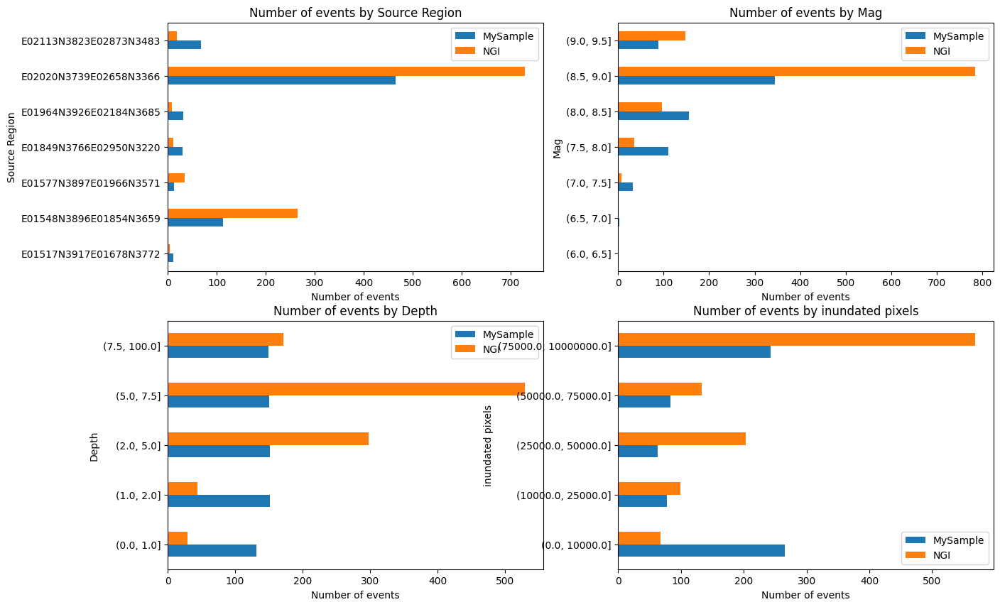

In [11]:

#Filter by reduced locations selected above
sample_events = underSample[underSample['Location'].isin (filter_locations['LocationKey'])] #do after sampling reduce locations

# check if all events match master PS list of 25 or 28k events from INGV
sample_events['ingv_id'] = pd.DataFrame(sample_events.ID.str.split('/',expand=True)[1].str[5:])
# sample_events['check'] = sample_events.ingv_id.isin(data_PS.ID)
sample_events = sample_events[sample_events.ingv_id.isin(data_PS.ID)]
data_ngi = data_ngi[data_ngi.ID.isin(data_PS.ID)]

#create comparison plot between 1080 from ngi and my selection
#data_PS vs data_ngi 

fig, ax = plt.subplots(2,2,figsize=(15, 10))

#plot the number of events by type - Source Region
count_all = sample_events.groupby('Source_Region')['Source_Region'].size().reset_index(name='counts')
count_sel = data_ngi.groupby('Source_Region')['Source_Region'].size().reset_index(name='counts')

#merge the counts from two dataframes and plot
count_all = count_all.merge(count_sel,how='left',on='Source_Region')
count_all.columns = ['Source_Region','MySample','NGI']
count_all.plot(kind='barh',ax=ax[0,0],x='Source_Region',y=['MySample','NGI'])
ax[0,0].set_title('Number of events by Source Region')
ax[0,0].set_xlabel('Number of events')
ax[0,0].set_ylabel('Source Region')

#plot the number of events by type - Mag
count_all = sample_events.groupby(pd.cut(sample_events['Mag'],[6,6.5,7,7.5,8,8.5,9,9.5]))['Mag'].size().reset_index(name='counts')
count_sel = data_ngi.groupby(pd.cut(data_ngi['Mag'],[6,6.5,7,7.5,8,8.5,9,9.5]))['Mag'].size().reset_index(name='counts')

#merge the counts from two dataframes and plot
count_all = count_all.merge(count_sel,how='left',on='Mag')
count_all.columns = ['Mag','MySample','NGI']
count_all.plot(kind='barh',ax=ax[0,1],x='Mag',y=['MySample','NGI'])
ax[0,1].set_title('Number of events by Mag')
ax[0,1].set_xlabel('Number of events')
ax[0,1].set_ylabel('Mag')

#plot the number of events by type - Depth
count_all = sample_events.groupby(pd.cut(sample_events['max_flow_depth'],[0,1,2,5,7.5,100]))['max_flow_depth'].size().reset_index(name='counts')
count_sel = data_ngi.groupby(pd.cut(data_ngi['max_flow_depth'],[0,1,2,5,7.5,100]))['max_flow_depth'].size().reset_index(name='counts')

#merge the counts from two dataframes and plot
count_all = count_all.merge(count_sel,how='left',on='max_flow_depth')
count_all.columns = ['max_flow_depth','MySample','NGI']
count_all.plot(kind='barh',ax=ax[1,0],x='max_flow_depth',y=['MySample','NGI'])
ax[1,0].set_title('Number of events by Depth')
ax[1,0].set_xlabel('Number of events')
ax[1,0].set_ylabel('Depth')


#plot the number of events by type - inundated_pixels
count_all = sample_events.groupby(pd.cut(sample_events['inundated_pixels'],[0,1e4,2.5e4,5e4,7.5e4,1e7]))['inundated_pixels'].size().reset_index(name='counts')
count_sel = data_ngi.groupby(pd.cut(data_ngi['inundated_pixels'],[0,1e4,2.5e4,5e4,7.5e4,1e7]))['inundated_pixels'].size().reset_index(name='counts')

#merge the counts from two dataframes and plot
count_all = count_all.merge(count_sel,how='left',on='inundated_pixels')
count_all.columns = ['inundated_pixels','MySample','NGI']
count_all.plot(kind='barh',ax=ax[1,1],x='inundated_pixels',y=['MySample','NGI'])
ax[1,1].set_title('Number of events by inundated pixels')
ax[1,1].set_xlabel('Number of events')
ax[1,1].set_ylabel('inundated pixels')
print(len(sample_events),' Sampled events vs NGI 1080 events')

plt.show()


plot for my selction


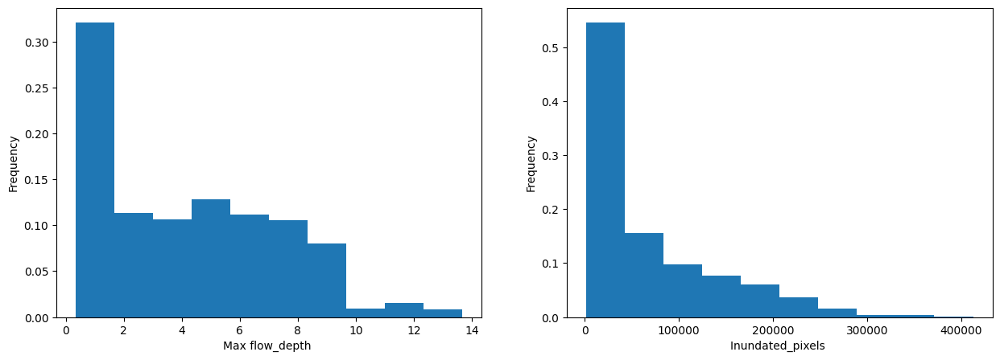

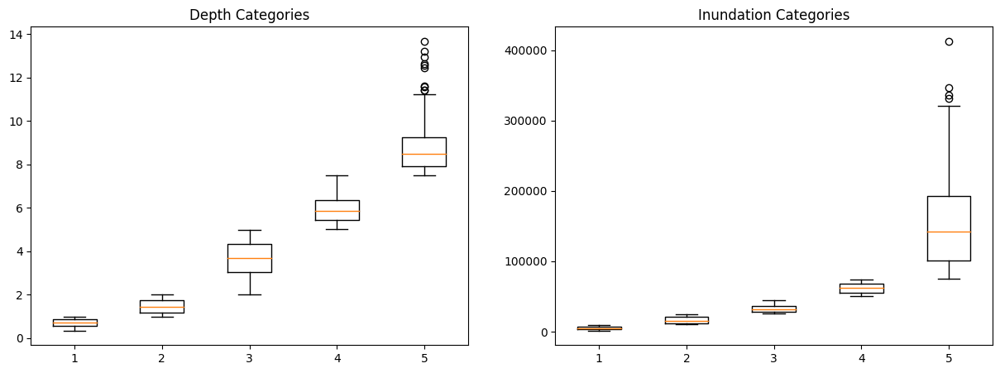

plot for ngi selection


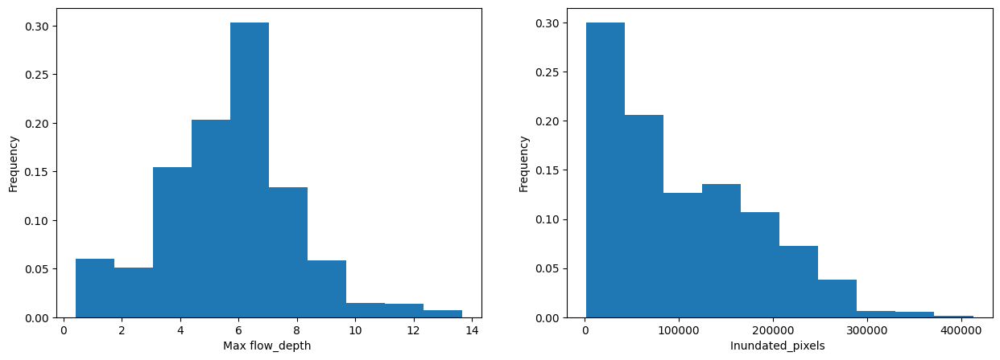

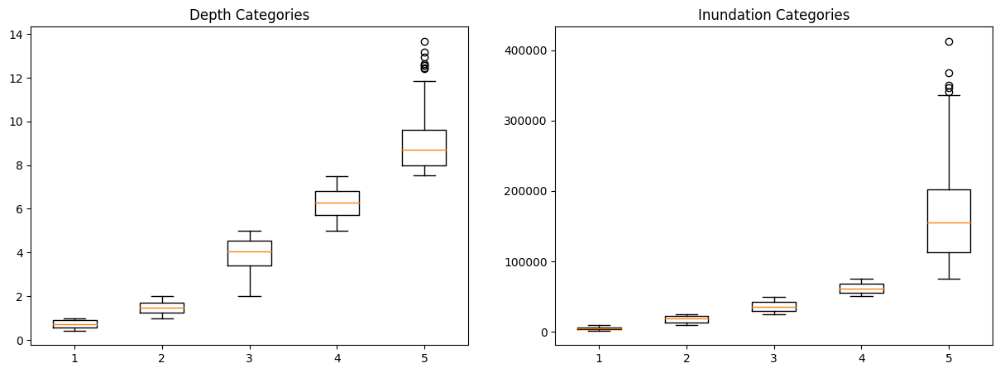

In [12]:
print('plot for my selction')
#plot boxplot of inundated pixels and depth
fig, ax = plt.subplots(1,2,figsize=(15, 5))
data = sample_events['inundated_pixels']
ax[1].hist(data, weights=np.ones_like(data) / len(data))
ax[1].set_xlabel('Inundated_pixels ')
ax[1].set_ylabel('Frequency')

data = sample_events['max_flow_depth']
ax[0].hist(data, weights=np.ones_like(data) / len(data))
ax[0].set_xlabel('Max flow_depth ')
ax[0].set_ylabel('Frequency')


#box plot after filtering locations
fig, ax = plt.subplots(1,2,figsize=(15,5))
Dcat1 = sample_events[sample_events['DepCat']=='1']
Dcat2 = sample_events[sample_events['DepCat']=='2']
Dcat3 = sample_events[sample_events['DepCat']=='3']
Dcat4 = sample_events[sample_events['DepCat']=='4']
Dcat5 = sample_events[sample_events['DepCat']=='5']
ax[0].boxplot([Dcat1['max_flow_depth'],Dcat2['max_flow_depth'],
               Dcat3['max_flow_depth'],Dcat4['max_flow_depth'],
               Dcat5['max_flow_depth']])
# ax[0].set_xticklabels( ['1', '2', '3', '4'])
ax[0].set_title('Depth Categories')

Icat1 = sample_events[sample_events['InuCat']=='1']
Icat2 = sample_events[sample_events['InuCat']=='2']
Icat3 = sample_events[sample_events['InuCat']=='3']
Icat4 = sample_events[sample_events['InuCat']=='4']
Icat5 = sample_events[sample_events['InuCat']=='5']
ax[1].boxplot([Icat1['inundated_pixels'],Icat2['inundated_pixels'],
               Icat3['inundated_pixels'],Icat4['inundated_pixels'],
               Icat5['inundated_pixels']])
# ax[1].set_xticklabels( ['1', '2', '3', '4'])
ax[1].set_title('Inundation Categories')
plt.show()

print('plot for ngi selection')

#categorise events
column = 'max_flow_depth'
depth_condition = [(data_ngi[column] <= 1),
                   (data_ngi[column] > 1) & (data_ngi[column] <= 2),
                   (data_ngi[column] > 2) & (data_ngi[column] <= 5),
                   (data_ngi[column] > 5) & (data_ngi[column] <= 7.5),
                   (data_ngi[column] > 7.5) ]
column = 'inundated_pixels'
inun_condition = [(data_ngi[column] <=1e4),
                   (data_ngi[column] > 1e4) & (data_ngi[column] <= 2.5e4),
                   (data_ngi[column] > 2.5e4) & (data_ngi[column] <= 5e4),
                   (data_ngi[column] > 5e4) & (data_ngi[column] <= 7.5e4),
                   (data_ngi[column] > 7.5e4)]

data_ngi['DepCat'] = np.select(depth_condition,cat[:len(depth_condition)],default='0')
data_ngi['InuCat'] = np.select(inun_condition,cat[:len(inun_condition)],default='0')

#plot of inundated pixels and depth
fig, ax = plt.subplots(1,2,figsize=(15, 5))
data = data_ngi['inundated_pixels']
ax[1].hist(data, weights=np.ones_like(data) / len(data))
ax[1].set_xlabel('Inundated_pixels ')
ax[1].set_ylabel('Frequency')

data = data_ngi['max_flow_depth']
ax[0].hist(data, weights=np.ones_like(data) / len(data))
ax[0].set_xlabel('Max flow_depth ')
ax[0].set_ylabel('Frequency')

#box plot ngi selection
fig, ax = plt.subplots(1,2,figsize=(15,5))
Dcat1 = data_ngi[data_ngi['DepCat']=='1']
Dcat2 = data_ngi[data_ngi['DepCat']=='2']
Dcat3 = data_ngi[data_ngi['DepCat']=='3']
Dcat4 = data_ngi[data_ngi['DepCat']=='4']
Dcat5 = data_ngi[data_ngi['DepCat']=='5']
ax[0].boxplot([Dcat1['max_flow_depth'],Dcat2['max_flow_depth'],
               Dcat3['max_flow_depth'],Dcat4['max_flow_depth'],
               Dcat5['max_flow_depth']])
# ax[0].set_xticklabels( ['1', '2', '3', '4'])
ax[0].set_title('Depth Categories')

Icat1 = data_ngi[data_ngi['InuCat']=='1']
Icat2 = data_ngi[data_ngi['InuCat']=='2']
Icat3 = data_ngi[data_ngi['InuCat']=='3']
Icat4 = data_ngi[data_ngi['InuCat']=='4']
Icat5 = data_ngi[data_ngi['InuCat']=='5']
ax[1].boxplot([Icat1['inundated_pixels'],Icat2['inundated_pixels'],
               Icat3['inundated_pixels'],Icat4['inundated_pixels'],
               Icat5['inundated_pixels']])
# ax[1].set_xticklabels( ['1', '2', '3', '4'])
ax[1].set_title('Inundation Categories')
plt.show()


In [13]:
# Create a Folium map centered on the data's extent
finalm = folium.Map(location=[np.mean(lat_xyz), np.mean(lon_xyz)], zoom_start=7)

regions = sample_events['Source_Region'].unique()
data_reg = region_all
data_reg = data_reg[data_reg['Region'].isin(regions)]
    
#Create a feature group for the earthquake events by type
fg_reg = folium.FeatureGroup(name='Regions').add_to(finalm)
#Add rectangles for each region
for index,row in data_reg.iterrows():
    info = f"ID:{row['Region']},Type: {row['Type']}"  # Create tooltip string
    UR = row['UL_Lat'],row['LR_Lon']
    LL = row['LR_Lat'],row['UL_Lon']

    folium.Rectangle(bounds=[UR,LL],
                     color=row['Col'],
                     fill=True,
                     fill_color='#ffff00',
                     fill_opacity=0.1,
                     tooltip=info,
                     permanent=True).add_to(fg_reg)
    
ncallback = ('function (row) {' 
                'var marker = L.marker(new L.LatLng(row[0], row[1]), {color: "red"});'
                'var icon = L.AwesomeMarkers.icon({'
                "icon: 'info-sign',"
                "iconColor: 'white',"
                "markerColor: 'red',"
                "prefix: 'glyphicon',"
                "extraClasses: 'fa-rotate-0'"
                    '});'
                'marker.setIcon(icon);'
                "var popup = L.popup({maxWidth: '500'});"
                "const display_text = {text: row[2]};"
                "var mytext = $(`<div id='mytext' class='display_text' style='width: 100.0%; height: 100.0%;'> ${display_text.text}</div>`)[0];"
                "popup.setContent(mytext);"
                "marker.bindPopup(popup);"
                'return marker};')
sample_events['pop'] = sample_events['ID'] + '_' + sample_events['inundated_pixels'].astype(str) + '_' + sample_events['max_flow_depth'].astype(str)
FastMarkerCluster(sample_events[['lat', 'lon','pop']].
                  values.tolist(), callback=ncallback,name='EQ Events').add_to(finalm)

# Add a layer control to turn on/off the feature groups
folium.LayerControl().add_to(finalm)

finalm

/tmp/ipykernel_362990/48018478.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sample_events['pop'] = sample_events['ID'] + '_' + sample_events['inundated_pixels'].astype(str) + '_' + sample_events['max_flow_depth'].astype(str)


In [14]:
#write to text file

sample_events['ingv_id'].to_csv('../resources/processed/sample_events' + 
                                str(len(sample_events)) + '.txt',sep='\t',
                                index=False,header=False)

data_ngi['ID'] .to_csv('../resources/processed/sample_eventsNGI'+
                       str(len(data_ngi)) + '.txt',sep='\t',
                       index=False,header=False)

data_events.to_csv('../resources/processed/all_eventsBS_PS'+
                       str(len(data_events)) + '.txt',sep='\t',
                       index=False,header=True)

DF_PSEvents.to_csv('../resources/processed/only_eventsPS'+
                       str(len(DF_PSEvents)) + '.txt',sep='\t',
                       index=False,header=True)

region_all.to_csv('../resources/processed/all_regions'+
                       str(len(region_all)) + '.txt',sep='\t',
                       index=False,header=True)




Read and plot for a given selection of events

In [43]:

sample_events = pd.read_csv('../data/events/shuffled_events.txt', header = None )
sample_events.columns = ['ID']
all_events = pd.read_csv('../resources/processed/only_eventsPS15000.txt',sep='\t')
all_events.ID = all_events.ID.str.split('/').str[1].str[5:]

sample_events = sample_events.merge(all_events)
sample_events = sample_events[sample_events['Mag'] >8.5]     

# Create a Folium map centered on the data's extent
finalm = folium.Map(location=[np.mean(lat_xyz), np.mean(lon_xyz)], zoom_start=7)

# Basemaps
folium.TileLayer(tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
        attr = 'Esri',
        name = 'Esri Satellite',
        overlay = False,
        control = True,
        show = True).add_to(finalm)

regions = sample_events['Source_Region'].unique()
data_reg = region_all
data_reg = data_reg[data_reg['Region'].isin(regions)]
    
#Create a feature group for the earthquake events by type
fg_reg = folium.FeatureGroup(name='Regions').add_to(finalm)
#Add rectangles for each region
for index,row in data_reg.iterrows():
    info = f"ID:{row['Region']},Type: {row['Type']}"  # Create tooltip string
    UR = row['UL_Lat'],row['LR_Lon']
    LL = row['LR_Lat'],row['UL_Lon']

    folium.Rectangle(bounds=[UR,LL],
                     color=row['Col'],
                     fill=True,
                     fill_color='#ffff00',
                     fill_opacity=0.1,
                     tooltip=info,
                     permanent=True).add_to(fg_reg)
    
ncallback = ('function (row) {' 
                'var marker = L.marker(new L.LatLng(row[0], row[1]), {color: "red"});'
                'var icon = L.AwesomeMarkers.icon({'
                "icon: 'info-sign',"
                "iconColor: 'white',"
                "markerColor: 'red',"
                "prefix: 'glyphicon',"
                "extraClasses: 'fa-rotate-0'"
                    '});'
                'marker.setIcon(icon);'
                "var popup = L.popup({maxWidth: '500'});"
                "const display_text = {text: row[2]};"
                "var mytext = $(`<div id='mytext' class='display_text' style='width: 100.0%; height: 100.0%;'> ${display_text.text}</div>`)[0];"
                "popup.setContent(mytext);"
                "marker.bindPopup(popup);"
                'return marker};')
sample_events['pop'] = sample_events['ID'] + '_' + sample_events['inundated_pixels'].astype(str) + '_' + sample_events['max_flow_depth'].astype(str)
FastMarkerCluster(sample_events[['lat', 'lon','pop']].
                  values.tolist(), callback=ncallback,name='EQ Events').add_to(finalm)

# Add a layer control to turn on/off the feature groups
folium.LayerControl().add_to(finalm)

finalm